# Final Project: Pitch Prediction
Group 9 
| Yuanyuan Ge, Alayna C. Myrick, Calvin Wu

**Import Packages**

In [1]:
# data analysis and wrangling
import pandas as pd
import numpy as np
import collections

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.tree import export_graphviz

#for some statistics
from scipy import stats
from scipy.stats import norm, skew 

# machine learning
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import  Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix,classification_report

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import plot_confusion_matrix
from sklearn import tree

#clear interface
import warnings
warnings.filterwarnings('ignore')

#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))

**Import data**

In [2]:
batters_df = pd.read_csv('Batter_info.csv')
pitches_df = pd.read_csv('Pitches.csv')
pitcher_info_df = pd.read_csv('Pitcher_info.csv')
pitching_stats_df = pd.read_csv('Pitching_stats.csv')
teams_df = pd.read_csv('Teams.csv')

**preview the data**

In [3]:
print('Batters.csv',batters_df.shape)
print('Pitches.csv',pitches_df.shape)
print('Pitching_stats.csv',pitching_stats_df.shape)
print('teams.csv',teams_df.shape)

Batters.csv (4457, 4)
Pitches.csv (2867162, 18)
Pitching_stats.csv (2825, 24)
teams.csv (30, 5)


In [10]:
batters_df.drop_duplicates(subset='batter_name',keep = 'last', inplace = True)

In [11]:
batters_df.head()

,batter_id,batter_name,team_id,year
0,430911,David Aardsma,2,2015
4,544365,Manny Banuelos,2,2015
9,466988,Emilio Bonifacio,2,2017
12,502010,Jake Brigham,2,2015
19,465674,Pedro Ciriaco,2,2015


In [12]:
pitches_df.drop_duplicates()

,pitcher_id,batter_id,g_id,throw,inning,outs,stand,top_bottom,end_speed,spin_rate,b_count,s_count,on_1b,on_2b,on_3b,pitch_num,pitch_type,outcome_code
0,452657,572761,201500001,L,1,1,L,top,84.100,2305.052,0,0,0,0,0,1,FF,C
1,452657,572761,201500001,L,1,1,L,top,84.100,2689.935,0,1,0,0,0,2,FF,S
2,452657,572761,201500001,L,1,1,L,top,85.200,2647.972,0,2,0,0,0,3,FF,F
3,452657,572761,201500001,L,1,1,L,top,84.000,1289.590,0,2,0,0,0,4,FF,B
4,452657,572761,201500001,L,1,1,L,top,69.600,1374.569,1,2,0,0,0,5,CU,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2867157,607054,543877,201802361,R,8,3,R,bottom,70.900,2088.913,0,0,1,0,0,1,CU,B
2867158,607054,543877,201802361,R,8,3,R,bottom,74.700,2080.368,1,0,1,0,0,2,CH,C
2867159,607054,543877,201802361,R,8,3,R,bottom,68.000,1702.034,1,1,1,0,0,3,CU,B
2867160,607054,543877,201802361,R,8,3,R,bottom,74.100,1634.515,2,1,1,0,0,4,CU,F


In [13]:
pitches_df.head()

,pitcher_id,batter_id,g_id,throw,inning,outs,stand,top_bottom,end_speed,spin_rate,b_count,s_count,on_1b,on_2b,on_3b,pitch_num,pitch_type,outcome_code
0,452657,572761,201500001,L,1,1,L,top,84.100,2305.052,0,0,0,0,0,1,FF,C
1,452657,572761,201500001,L,1,1,L,top,84.100,2689.935,0,1,0,0,0,2,FF,S
2,452657,572761,201500001,L,1,1,L,top,85.200,2647.972,0,2,0,0,0,3,FF,F
3,452657,572761,201500001,L,1,1,L,top,84.000,1289.590,0,2,0,0,0,4,FF,B
4,452657,572761,201500001,L,1,1,L,top,69.600,1374.569,1,2,0,0,0,5,CU,B


In [14]:
pitching_stats_df.head()

,Stats_id,pitcher_id,pitcher_name,team_id,wins,loses,era,g_played,g_started,g_finished,...,runs,errors,hr,bb,int_bb,strike_outs,hit_by_pitch,balks,wild,year
0,1,430911,David Aardsma,2,1,1,4.700,33,0,9,...,17,16,6,14,3,35,1,0,1,2015
1,2,502010,Jake Brigham,2,0,1,8.640,12,0,4,...,16,16,1,8,1,12,1,0,2,2015
2,3,592181,Danny Burawa,2,0,0,3.650,12,0,4,...,5,5,1,4,0,10,1,0,0,2015
3,4,502239,Trevor Cahill,2,0,3,7.520,15,3,6,...,23,22,2,11,1,14,1,0,1,2015
4,5,502304,David Carpenter,2,0,0,7.360,4,0,1,...,3,3,2,0,0,5,0,0,0,2015


In [15]:
teams_df.head()

,team_id,team_abv,team_name,league,region
0,1,ARI,Arizona Diamondbacks,National,West
1,2,ATL,Atlanta Braves,National,East
2,3,BAL,Baltimore Orioles,American,East
3,4,BOS,Boston Red Sox,American,East
4,5,CHC,Chicago Cubs,National,Central


**join the tables**

In [47]:
p_match = pd.merge(pitches_df,pitching_stats_df, how='inner', on='pitcher_id',
         left_index=False, right_index=False, sort=True,
         suffixes=('_', '_1'), copy=True, indicator=False,
         validate=None)

In [48]:
p_t_match = pd.merge(p_match, teams_df, how='inner', on='team_id',
         left_index=False, right_index=False, sort=True,
         suffixes=('_', '_1'), copy=True, indicator=False,
         validate=None)

In [49]:
all_data = pd.merge(p_t_match, batters_df, how='inner', on='batter_id',
         left_index=False, right_index=False, sort=True,
         suffixes=('_pitcher', '_batter'), copy=True, indicator=False,
         validate=None)

In [50]:
all_data = pd.merge(all_data, teams_df, how='inner', left_on='team_id_batter',right_on='team_id',
         left_index=False, right_index=False, sort=True,
         suffixes=('_pitcher', '_batter'), copy=True, indicator=False,
         validate=None)

In [16]:
all_data.shape

(8742996, 53)

**clean data**

In [17]:
# missing value check
missing_ratio = all_data.isnull().sum()/len(all_data)*100
show=missing_ratio[missing_ratio!=0].sort_values(ascending=False)
print(len(show))
show

5


pitch_type     0.487
spin_rate      0.487
end_speed      0.485
outcome_code   0.190
era            0.002
dtype: float64

In [20]:
# drop rows with na
all_data = all_data.dropna()
all_data.shape

(8683625, 53)

In [72]:
#drop id and dulplicate columns
all_data = all_data.drop(['pitcher_id', 'batter_id', 'g_id', 'Stats_id',
       'pitcher_name', 'team_id_pitcher', 'era', 'year_pitcher',
       'team_id_batter', 'year_batter', 'team_id'],axis=1)

**take a look at the descriptive info**

In [22]:
all_data.describe().T

,count,mean,std,min,25%,50%,75%,max
inning,8683625.000,5.031,2.679,1.000,3.000,5.000,7.000,19.000
outs,8683625.000,1.678,0.952,0.000,1.000,2.000,2.000,3.000
end_speed,8683625.000,81.390,5.340,32.400,78.000,82.600,85.400,96.900
spin_rate,8683625.000,1734.530,683.954,1.214,1242.293,1868.914,2250.476,6539.259
b_count,8683625.000,0.878,0.964,0.000,0.000,1.000,1.000,4.000
s_count,8683625.000,0.886,0.825,0.000,0.000,1.000,2.000,2.000
on_1b,8683625.000,0.300,0.458,0.000,0.000,0.000,1.000,1.000
on_2b,8683625.000,0.182,0.386,0.000,0.000,0.000,0.000,1.000
on_3b,8683625.000,0.094,0.291,0.000,0.000,0.000,0.000,1.000
pitch_num,8683625.000,2.896,1.727,1.000,1.000,3.000,4.000,21.000


In [23]:
all_data.describe(include=['O']).T

,count,unique,top,freq
throw,8683625,2,R,6438548
stand,8683625,2,R,5025988
top_bottom,8683625,2,top,4418677
pitch_type,8683625,17,FF,3101123
outcome_code,8683625,19,B,2898183
team_abv_pitcher,8683625,29,ARI,375355
team_name_pitcher,8683625,29,Arizona Diamondbacks,375355
league_pitcher,8683625,2,National,4494973
region_pitcher,8683625,3,East,3022729
batter_name,8683625,1599,Paul Goldschmidt,37361


In [75]:
all_data['pitch_type'].value_counts(dropna=False)[:]

FF    3101123
SL    1380659
FT    1000275
CH     867160
SI     728839
CU     678167
FC     504720
KC     225448
FS     133944
KN      35813
IN      19223
FO       3706
EP       2619
PO       1726
UN        153
AB         30
FA         20
Name: pitch_type, dtype: int64

**Run visualizations of the target variable**

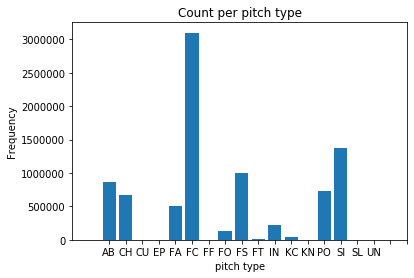

In [91]:
#plot: pitch type counts
c = collections.Counter(all_data['pitch_type'])
c = sorted(c.items())
pitch_type = [i[0] for i in c]
freq = [i[1] for i in c]

f, ax = plt.subplots()

plt.bar(pitch_type, freq)
plt.title("Count per pitch type")
plt.xlabel("pitch type")
plt.ylabel("Frequency")
ax.set_xticks(range(1, 20))
ax.set_xticklabels(pitch_type)

plt.show()

**change the target variable 'pitch type' into 'pitch class'** (leverage domain knowledge and make the dataset more balanced)

fastballs
'FF' : four-seam fastball
'FT' : two-seam fastball
'FC' : fastball (cutter)
’FA’ :	Four-Seam Fastball (FA)
'FS' :	Splitter (FS)

Breaking Balls:
CU:Curveball (CU)
SL:Slider (SL)
SC:Screwball (SC)
KC:Knuckle-curve (KC)

Change Ups:
CH:changeup

Knuckleball:
KB

In [51]:
all_data['pitch_class']='other'
#merging levels of pitch type to make fewer class that will hold more meaning. 
#Fastballs
all_data['pitch_class']=np.where(all_data['pitch_type'] =='FF','Fastballs', all_data['pitch_class'])
all_data['pitch_class']=np.where(all_data['pitch_type'] =='FT','Fastballs', all_data['pitch_class'])
all_data['pitch_class']=np.where(all_data['pitch_type'] =='FC','Fastballs', all_data['pitch_class'])
all_data['pitch_class']=np.where(all_data['pitch_type'] =='FS','Fastballs', all_data['pitch_class'])
all_data['pitch_class']=np.where(all_data['pitch_type'] =='FA','Fastballs', all_data['pitch_class'])

In [52]:
#Breaking Balls
all_data['pitch_class']=np.where(all_data['pitch_type'] =='CU', 'Breaking Balls',all_data['pitch_class'])
all_data['pitch_class']=np.where(all_data['pitch_type'] =='SL', 'Breaking Balls',all_data['pitch_class'])
all_data['pitch_class']=np.where(all_data['pitch_type'] =='SC', 'Breaking Balls',all_data['pitch_class'])
all_data['pitch_class']=np.where(all_data['pitch_type'] =='KC', 'Breaking Balls',all_data['pitch_class'])

In [53]:
#Change Ups
all_data['pitch_class']=np.where(all_data['pitch_type'] =='CH', 'Change Ups',all_data['pitch_class'])
#Knuckleball
all_data['pitch_class']=np.where(all_data['pitch_type'] =='KB', 'Change Ups',all_data['pitch_class'])

In [54]:
#drop the other rows with pitch types since they are not real 'pitch types'
all_data.drop(all_data[all_data['pitch_class']=='other'].index, axis=0,inplace=True)

In [73]:
all_data

,throw,inning,outs,stand,top_bottom,end_speed,spin_rate,b_count,s_count,on_1b,...,team_abv_pitcher,team_name_pitcher,league_pitcher,region_pitcher,batter_name,team_abv_batter,team_name_batter,league_batter,region_batter,pitch_class
0,R,2,3,R,bottom,69.100,1875.588,0,0,0,...,MIN,Minnesota Twins,American,Central,Gerald Laird,ARI,Arizona Diamondbacks,National,West,Breaking Balls
1,R,2,3,R,bottom,73.000,1764.569,0,1,0,...,MIN,Minnesota Twins,American,Central,Gerald Laird,ARI,Arizona Diamondbacks,National,West,Breaking Balls
4,R,2,3,R,bottom,69.100,1875.588,0,0,0,...,SFG,San Francisco Giants,National,West,Gerald Laird,ARI,Arizona Diamondbacks,National,West,Breaking Balls
5,R,2,3,R,bottom,69.100,1875.588,0,0,0,...,SFG,San Francisco Giants,National,West,Gerald Laird,ARI,Arizona Diamondbacks,National,West,Breaking Balls
6,R,2,3,R,bottom,73.000,1764.569,0,1,0,...,SFG,San Francisco Giants,National,West,Gerald Laird,ARI,Arizona Diamondbacks,National,West,Breaking Balls
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8742989,R,9,1,L,top,80.800,2284.762,2,0,0,...,WSN,Washington Nationals,National,East,Juan Soto,WSN,Washington Nationals,National,East,Change Ups
8742990,R,9,1,L,top,80.800,2284.762,2,0,0,...,WSN,Washington Nationals,National,East,Juan Soto,WSN,Washington Nationals,National,East,Change Ups
8742991,R,9,1,L,top,79.800,255.297,3,0,0,...,WSN,Washington Nationals,National,East,Juan Soto,WSN,Washington Nationals,National,East,Breaking Balls
8742992,R,9,1,L,top,79.800,255.297,3,0,0,...,WSN,Washington Nationals,National,East,Juan Soto,WSN,Washington Nationals,National,East,Breaking Balls


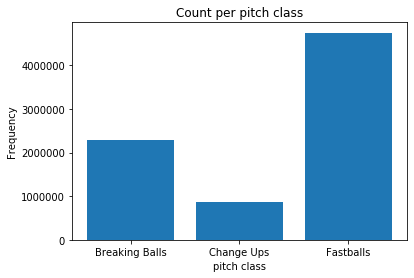

In [59]:
#plot: pitch class counts
c = collections.Counter(all_data['pitch_class'])
c = sorted(c.items())
pitch_class = [i[0] for i in c]
freq = [i[1] for i in c]

f, ax = plt.subplots()

plt.bar(pitch_class, freq)
plt.title("Count per pitch class")
plt.xlabel("pitch class")
plt.ylabel("Frequency")
ax.set_xticks(range(0, 3))
ax.set_xticklabels(pitch_class)

plt.show()

**Model Development**

**Model 1-All batters against all pitchers**

In [75]:
y = all_data['pitch_class']
features = all_data.drop(['pitch_type','pitch_class'],axis=1)

In [77]:
features = features.drop(['team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter'],axis=1)
#get dummies
features = pd.get_dummies(features)
print(features.shape)

(7907127, 47)


In [78]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size = 0.25, random_state = 42)

In [79]:
rfc = RandomForestClassifier(n_estimators = 100)
rfc.fit(X_train, y_train)
rfc.pred = rfc.predict(X_test)

In [80]:
print(classification_report(y_test,rfc.pred))

                precision    recall  f1-score   support

Breaking Balls       0.95      0.96      0.96    571945
    Change Ups       0.92      0.86      0.89    217545
     Fastballs       0.98      0.99      0.98   1187292

      accuracy                           0.97   1976782
     macro avg       0.95      0.94      0.94   1976782
  weighted avg       0.96      0.97      0.96   1976782



Confusion matrix, without normalization
[[ 550655    9010   12280]
 [  17715  187512   12318]
 [  11066    6282 1169944]]
Normalized confusion matrix
[[0.96277614 0.01575326 0.0214706 ]
 [0.08143143 0.8619458  0.05662277]
 [0.00932037 0.00529103 0.9853886 ]]


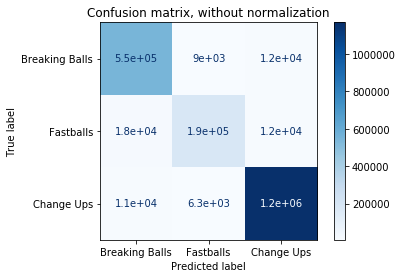

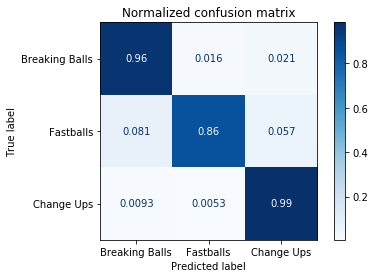

In [81]:
class_names = y.unique()

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rfc, X_test, y_test,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

**Model 2-National League pitchers v. American League batters**

In [82]:
#filter the dataset
data2 = all_data[all_data['league_pitcher']=='National']
data2 = data2[data2['league_batter']=='American']

In [83]:
y2 = data2['pitch_class']
features2 = data2.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter'],axis=1)
features2 = pd.get_dummies(features2)
print(features2.shape)

(1325814, 47)


In [84]:
# Split the data into training and testing sets
X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, y2, test_size = 0.25, random_state = 42)

In [85]:
rfc2 = RandomForestClassifier(n_estimators = 100)
rfc2.fit(X_train2, y_train2)
rfc2.pred = rfc2.predict(X_test2)

In [86]:
print(classification_report(y_test2,rfc2.pred))

                precision    recall  f1-score   support

Breaking Balls       0.95      0.96      0.96     94813
    Change Ups       0.93      0.85      0.89     37262
     Fastballs       0.98      0.99      0.98    199379

      accuracy                           0.96    331454
     macro avg       0.95      0.93      0.94    331454
  weighted avg       0.96      0.96      0.96    331454



Confusion matrix, without normalization
[[ 91357   1400   2056]
 [  3185  31831   2246]
 [  1777    965 196637]]
Normalized confusion matrix
[[0.9635493  0.01476591 0.02168479]
 [0.08547582 0.8542483  0.06027588]
 [0.00891267 0.00484003 0.9862473 ]]


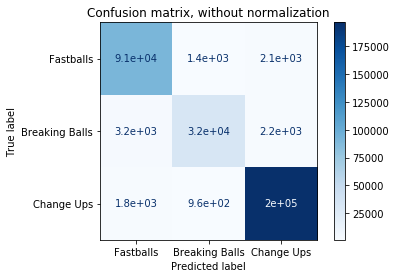

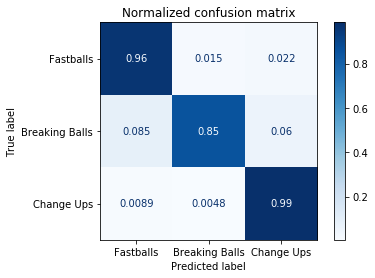

In [145]:
class_names = y2.unique()

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rfc2, X_test2, y_test2,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

**Model 3-National League batters v. American League pitchers**

In [87]:
#filter the dataset
data3 = all_data[all_data['league_pitcher']== 'American']
data3 = data3[data3['league_batter']=='National']

In [88]:
y3 = data3['pitch_class']
features3 = data3.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter'],axis=1)
features3 = pd.get_dummies(features3)
print(features3.shape)

(1238566, 47)


In [89]:
# Split the data into training and testing sets
X_train3, X_test3, y_train3, y_test3 = train_test_split(features3, y3, test_size = 0.25, random_state = 42)

In [90]:
rfc3 = RandomForestClassifier(n_estimators = 100)
rfc3.fit(X_train3, y_train3)
rfc3.pred = rfc3.predict(X_test3)

In [91]:
print(classification_report(y_test3,rfc3.pred))

                precision    recall  f1-score   support

Breaking Balls       0.95      0.96      0.96     87609
    Change Ups       0.93      0.85      0.89     33288
     Fastballs       0.98      0.99      0.98    188745

      accuracy                           0.96    309642
     macro avg       0.95      0.93      0.94    309642
  weighted avg       0.96      0.96      0.96    309642



Confusion matrix, without normalization
[[ 84250   1357   2002]
 [  2768  28442   2078]
 [  1780    913 186052]]
Normalized confusion matrix
[[0.96165919 0.01548928 0.02285153]
 [0.08315309 0.85442201 0.0624249 ]
 [0.00943071 0.00483721 0.98573207]]


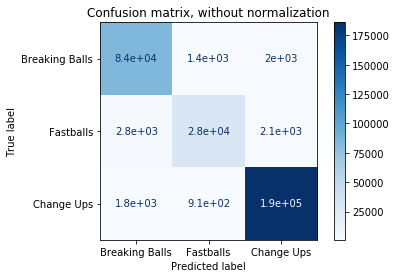

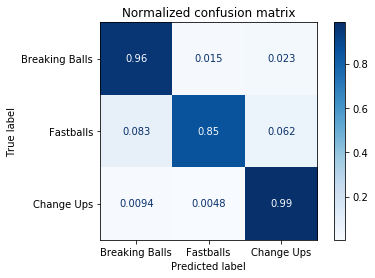

In [146]:
class_names = y3.unique()

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rfc3, X_test3, y_test3,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

**Model 4-All Pitchers v.  Astro Batters**

In [92]:
#filter the dataset
data4 = all_data[all_data['team_abv_batter']=='HOU']

In [93]:
y4 = data4['pitch_class']
features4 = data4.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter'],axis=1)
features4 = pd.get_dummies(features4)
print(features4.shape)

(319902, 47)


In [94]:
# Split the data into training and testing sets
X_train4, X_test4, y_train4, y_test4 = train_test_split(features4, y4, test_size = 0.25, random_state = 42)

In [95]:
rfc4 = RandomForestClassifier(n_estimators = 100)
rfc4.fit(X_train4, y_train4)
rfc4.pred = rfc4.predict(X_test4)

In [96]:
print(classification_report(y_test4,rfc4.pred))

                precision    recall  f1-score   support

Breaking Balls       0.93      0.97      0.95     23612
    Change Ups       0.94      0.81      0.87      9088
     Fastballs       0.98      0.98      0.98     47276

      accuracy                           0.96     79976
     macro avg       0.95      0.92      0.93     79976
  weighted avg       0.96      0.96      0.96     79976



Confusion matrix, without normalization
[[22912   235   465]
 [ 1091  7369   628]
 [  679   194 46403]]
Normalized confusion matrix
[[0.97035406 0.00995257 0.01969338]
 [0.12004842 0.81084947 0.06910211]
 [0.01436247 0.00410356 0.98153397]]


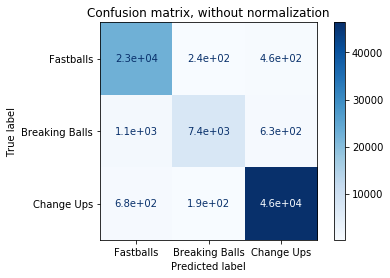

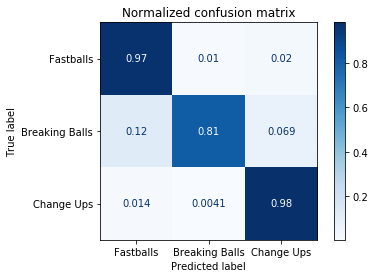

In [147]:
class_names = y4.unique()

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rfc4, X_test4, y_test4,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

**Model 5-Dodgers Pitchers v. Astros Batters**

In [97]:
#filter the dataset
data5 = all_data[ all_data['team_abv_pitcher']== 'LAD']
data5 = data5[data5['team_abv_batter']=='HOU']

In [98]:
y5 = data5['pitch_class']
features5 = data5.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter'],axis=1)
features5 = pd.get_dummies(features5)
print(features5.shape)

(7893, 47)


In [99]:
# Split the data into training and testing sets
X_train5, X_test5, y_train5, y_test5 = train_test_split(features5, y5, test_size = 0.25, random_state = 42)

In [100]:
rfc5 = RandomForestClassifier(n_estimators = 100)
rfc5.fit(X_train5, y_train5)
rfc5.pred = rfc5.predict(X_test5)

In [101]:
print(classification_report(y_test5,rfc5.pred))

                precision    recall  f1-score   support

Breaking Balls       0.95      0.96      0.96       708
    Change Ups       0.89      0.80      0.84       145
     Fastballs       0.98      0.99      0.98      1121

      accuracy                           0.96      1974
     macro avg       0.94      0.92      0.93      1974
  weighted avg       0.96      0.96      0.96      1974



Confusion matrix, without normalization
[[ 683   11   14]
 [  21  116    8]
 [  13    3 1105]]
Normalized confusion matrix
[[0.96468927 0.01553672 0.01977401]
 [0.14482759 0.8        0.05517241]
 [0.01159679 0.00267618 0.98572703]]


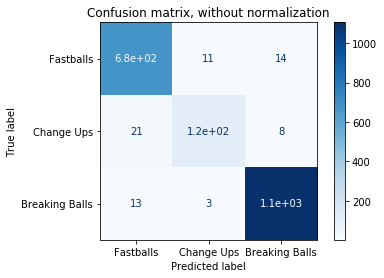

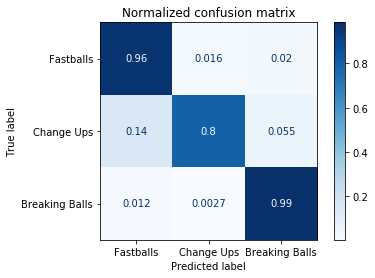

In [148]:
class_names = y5.unique()

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rfc5, X_test5, y_test5,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

**Model 6-Astros Pitchers v. Dodger Batters**

In [177]:
#filter the dataset
data6 = all_data[ all_data['team_abv_pitcher']== 'HOU']
data6 = data6[data6['team_abv_batter']=='LAD']

In [178]:
y6 = data6['pitch_class']
features6 = data6.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter'],axis=1)
features6 = pd.get_dummies(features6)
print(features6.shape)

(11419, 47)


In [179]:
# Split the data into training and testing sets
X_train6, X_test6, y_train6, y_test6 = train_test_split(features6, y6, test_size = 0.25, random_state = 42)

In [180]:
rfc6 = RandomForestClassifier(n_estimators = 100)
rfc6.fit(X_train6, y_train6)
rfc6.pred = rfc6.predict(X_test6)

In [181]:
print(classification_report(y_test6,rfc6.pred))

                precision    recall  f1-score   support

Breaking Balls       0.92      0.96      0.94       865
    Change Ups       0.87      0.75      0.80       300
     Fastballs       0.98      0.98      0.98      1690

      accuracy                           0.95      2855
     macro avg       0.92      0.90      0.91      2855
  weighted avg       0.95      0.95      0.95      2855



Confusion matrix, without normalization
[[ 829   19   17]
 [  58  224   18]
 [  16   14 1660]]
Normalized confusion matrix
[[0.9583815  0.02196532 0.01965318]
 [0.19333333 0.74666667 0.06      ]
 [0.00946746 0.00828402 0.98224852]]


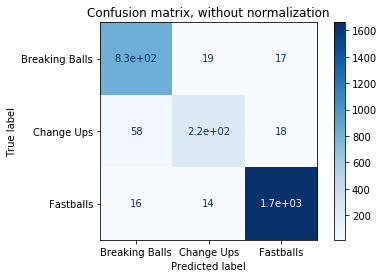

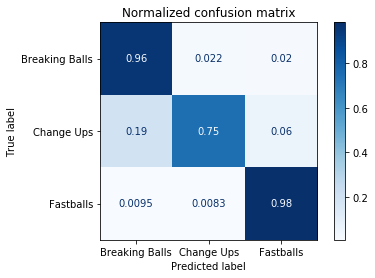

In [182]:
class_names = y6.unique()

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rfc6, X_test6, y_test6,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

**Draw a decision tree for all pitchers & batters to interprete**

In [193]:
#choose a small sample to build a decision tree
BB = all_data[all_data['pitch_class']=='Breaking Balls'][:1000]
CU = all_data[all_data['pitch_class']=='Change Ups'][:1000]
FB = all_data[all_data['pitch_class']=='Fastballs'][:1000]
df = pd.concat([BB, CU], ignore_index=True)
df = pd.concat([FB,df], ignore_index=True)

In [195]:
X222=df.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter','top_bottom', 'end_speed',
       'spin_rate', 'outcome_code', 'wins', 'loses', 'g_played', 'g_started',
       'g_finished', 'shutouts', 'saves', 'innings_pitched', 'hits', 'runs',
       'errors', 'hr', 'bb', 'int_bb', 'strike_outs', 'hit_by_pitch', 'balks',
       'wild'],axis=1)
X222 = pd.get_dummies(X222)
y222 = df['pitch_class']

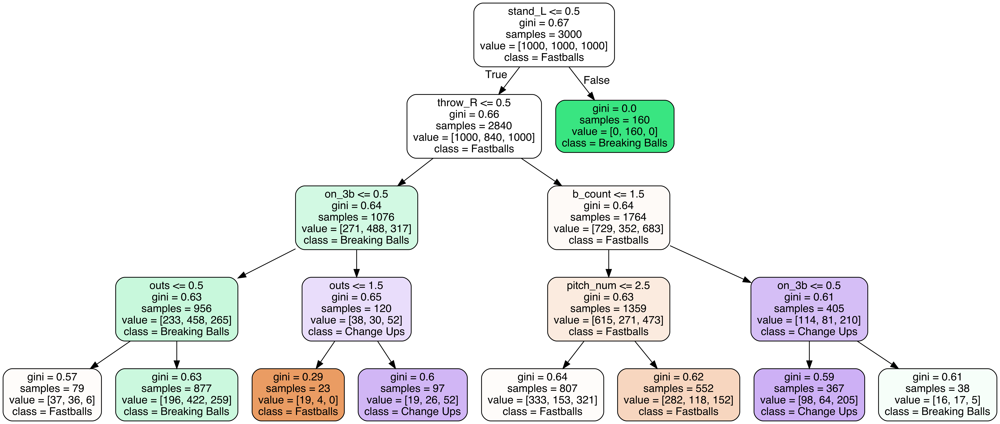

In [201]:
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X222, y222)
# Draw Tree diagram and Export as dot file
export_graphviz(clf, out_file='tree.dot', 
                feature_names = X222.columns,
                class_names = y222.unique(),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

**tree for model 2**

In [210]:
#choose a small sample to build a decision tree
BB = data2[data2['pitch_class']=='Breaking Balls'][:1000]
CU = data2[data2['pitch_class']=='Change Ups'][:1000]
FB = data2[data2['pitch_class']=='Fastballs'][:1000]
df2 = pd.concat([BB, CU], ignore_index=True)
df2 = pd.concat([FB,df], ignore_index=True)
X2=df2.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter','top_bottom', 'end_speed',
       'spin_rate', 'outcome_code', 'wins', 'loses', 'g_played', 'g_started',
       'g_finished', 'shutouts', 'saves', 'innings_pitched', 'hits', 'runs',
       'errors', 'hr', 'bb', 'int_bb', 'strike_outs', 'hit_by_pitch', 'balks',
       'wild'],axis=1)
X2 = pd.get_dummies(X2)
y2 = df2['pitch_class']
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X2, y2)
# Draw Tree diagram and Export as dot file
export_graphviz(clf, out_file='tree.dot', 
                feature_names = X2.columns,
                class_names = y2.unique(),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

**tree for model 3**

In [211]:
#choose a small sample to build a decision tree
BB = data3[data3['pitch_class']=='Breaking Balls'][:1000]
CU = data3[data3['pitch_class']=='Change Ups'][:1000]
FB = data3[data3['pitch_class']=='Fastballs'][:1000]
df3 = pd.concat([BB, CU], ignore_index=True)
df3 = pd.concat([FB,df], ignore_index=True)
X3=df3.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter','top_bottom', 'end_speed',
       'spin_rate', 'outcome_code', 'wins', 'loses', 'g_played', 'g_started',
       'g_finished', 'shutouts', 'saves', 'innings_pitched', 'hits', 'runs',
       'errors', 'hr', 'bb', 'int_bb', 'strike_outs', 'hit_by_pitch', 'balks',
       'wild'],axis=1)
X3 = pd.get_dummies(X3)
y3 = df3['pitch_class']
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X3[:3000], y3[:3000])
# Draw Tree diagram and Export as dot file
export_graphviz(clf, out_file='tree.dot', 
                feature_names = X3.columns,
                class_names = y3.unique(),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

**tree for model 4**

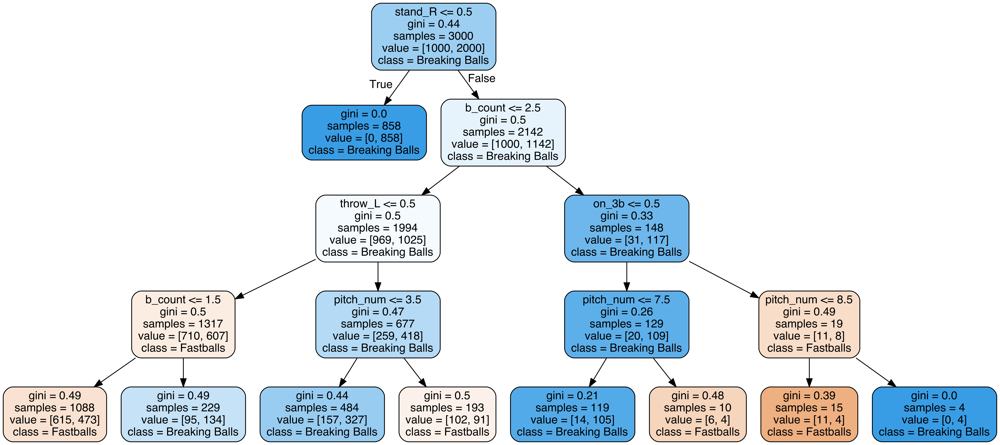

In [212]:
BB = data4[data4['pitch_class']=='Breaking Balls'][:1000]
CU = data4[data4['pitch_class']=='Change Ups'][:1000]
FB = data4[data4['pitch_class']=='Fastballs'][:1000]
df4 = pd.concat([BB, CU], ignore_index=True)
df4 = pd.concat([FB,df], ignore_index=True)
X4=df4.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter','top_bottom', 'end_speed',
       'spin_rate', 'outcome_code', 'wins', 'loses', 'g_played', 'g_started',
       'g_finished', 'shutouts', 'saves', 'innings_pitched', 'hits', 'runs',
       'errors', 'hr', 'bb', 'int_bb', 'strike_outs', 'hit_by_pitch', 'balks',
       'wild'],axis=1)
X4 = pd.get_dummies(X4)
y4 = df4['pitch_class']
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X4[:3000], y4[:3000])
# Draw Tree diagram and Export as dot file
export_graphviz(clf, out_file='tree.dot', 
                feature_names = X3.columns,
                class_names = y3.unique(),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

**tree for model 5**

In [131]:
# using Dodgers Pitchers v. Astros Batters data
X111 = data6.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter','top_bottom', 'end_speed',
       'spin_rate', 'outcome_code', 'wins', 'loses', 'g_played', 'g_started',
       'g_finished', 'shutouts', 'saves', 'innings_pitched', 'hits', 'runs',
       'errors', 'hr', 'bb', 'int_bb', 'strike_outs', 'hit_by_pitch', 'balks',
       'wild'],axis=1)
X111 = pd.get_dummies(X111)
y111 = y6

In [140]:
clf5 = RandomForestClassifier(n_estimators=10, random_state=123,max_depth=3)
X_train7, X_test7, y_train7, y_test7 = train_test_split(X111, y111, test_size = 0.25, random_state = 42)

In [141]:
clf5.fit(X_train7, y_train7)
clf5.pred = clf5.predict(X_test7)
print(classification_report(y_test7,clf5.pred))

                precision    recall  f1-score   support

Breaking Balls       0.54      0.17      0.26       708
    Change Ups       0.00      0.00      0.00       145
     Fastballs       0.60      0.93      0.73      1121

      accuracy                           0.59      1974
     macro avg       0.38      0.37      0.33      1974
  weighted avg       0.53      0.59      0.51      1974



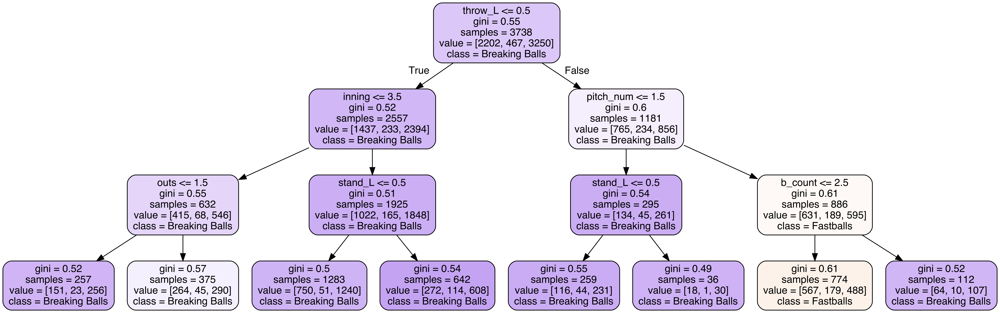

In [143]:
estimator = clf5.estimators_[1]
# Draw Tree diagram and Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X111.columns,
                class_names = y111.unique(),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

**tree for model 6**

In [214]:
BB = data6[data6['pitch_class']=='Breaking Balls'][:1000]
CU = data6[data6['pitch_class']=='Change Ups'][:1000]
FB = data6[data6['pitch_class']=='Fastballs'][:1000]
df6 = pd.concat([BB, CU], ignore_index=True)
df6 = pd.concat([FB,df], ignore_index=True)

X6=df6.drop(['pitch_type','pitch_class','team_abv_pitcher', 'team_name_pitcher', 'league_pitcher',
       'region_pitcher', 'batter_name', 'team_abv_batter', 'team_name_batter',
       'league_batter', 'region_batter','top_bottom', 'end_speed',
       'spin_rate', 'outcome_code', 'wins', 'loses', 'g_played', 'g_started',
       'g_finished', 'shutouts', 'saves', 'innings_pitched', 'hits', 'runs',
       'errors', 'hr', 'bb', 'int_bb', 'strike_outs', 'hit_by_pitch', 'balks',
       'wild'],axis=1)
X6 = pd.get_dummies(X6)
y6 = df6['pitch_class']
clf = tree.DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X6, y6)
# Draw Tree diagram and Export as dot file
export_graphviz(clf, out_file='tree.dot', 
                feature_names = X3.columns,
                class_names = y3.unique(),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

**Probability Analysis**

**Dodger Pitchers v. Astros Hitters**

In [127]:
clf1 = LogisticRegression(max_iter=1000, random_state=123)
clf2 = GaussianNB()
clf3 = RandomForestClassifier(n_estimators=100, random_state=123)

X = features5
y = y5

eclf = VotingClassifier(estimators=[('lr', clf1), ('gnb', clf2), ('rf', clf3)],
                        voting='soft',
                        weights=[1, 1, 5])

# predict class probabilities for all classifiers
probas = [c.fit(X, y).predict_proba(X) for c in (clf1, clf2, clf3, eclf)]

In [110]:
print("Logistic Regression score:",clf1.score(X, y))
print("GaussianNB score:",clf2.score(X, y))
print("Random Forest Classifier score:",clf3.score(X, y))
print("Voting Classifier score:",eclf.score(X, y))

Logistic Regression score: 0.7754972760674015
GaussianNB score: 0.5349043456227036
Random Forest Classifier score: 1.0
Voting Classifier score: 0.9994932218421386


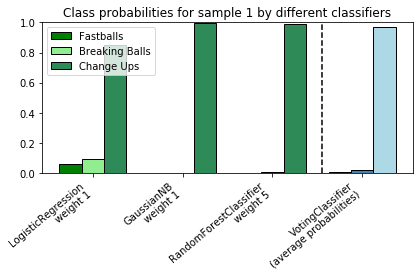

In [136]:
# get class probabilities for the first sample in the dataset
class1_1 = [pr[0, 0] for pr in probas] #Fastballs
class2_1 = [pr[0, 1] for pr in probas] #Breaking Balls
class3_1 = [pr[0, 2] for pr in probas] #Change Ups

# plotting

N = 4  # number of groups
ind = np.arange(N)  # group positions
width = 0.25  # bar width

fig, ax = plt.subplots()

# bars for classifier 1-3
p1 = ax.bar(ind, np.hstack(([class1_1[:-1], [0]])), width,
            color='green', edgecolor='k')
p2 = ax.bar(ind + width, np.hstack(([class2_1[:-1], [0]])), width,
            color='lightgreen', edgecolor='k')
p3 = ax.bar(ind + 2*width, np.hstack(([class3_1[:-1], [0]])), width,
            color='seagreen', edgecolor='k')


# bars for VotingClassifier
p4 = ax.bar(ind, [0, 0, 0, class1_1[-1]], width,
            color='blue', edgecolor='k')
p5 = ax.bar(ind + width, [0, 0, 0, class2_1[-1]], width,
            color='steelblue', edgecolor='k')
p6 = ax.bar(ind + 2*width, [0, 0, 0, class3_1[-1]], width,
            color='lightblue', edgecolor='k')


# plot annotations
plt.axvline(2.8, color='k', linestyle='dashed')
ax.set_xticks(ind + width)
ax.set_xticklabels(['LogisticRegression\nweight 1',
                    'GaussianNB\nweight 1',
                    'RandomForestClassifier\nweight 5',
                    'VotingClassifier\n(average probabilities)'],
                   rotation=40,
                   ha='right')
plt.ylim([0, 1])
plt.title('Class probabilities for sample 1 by different classifiers')
plt.legend([p1[0], p2[0], p3[0]], ['Fastballs', 'Breaking Balls','Change Ups'], loc='upper left')
plt.tight_layout()
plt.show()

**Astros Pitchers v. Dodgers Hitters**

In [113]:
clf1 = LogisticRegression(max_iter=1000, random_state=123)
clf2 = GaussianNB()
clf3 = RandomForestClassifier(n_estimators=100, random_state=123)

X = features6
y = y6

eclf = VotingClassifier(estimators=[('lr', clf1), ('gnb', clf2), ('rf', clf3)],
                        voting='soft',
                        weights=[1, 1, 5])

# predict class probabilities for all classifiers
probas = [c.fit(X, y).predict_proba(X) for c in (clf1, clf2, clf3, eclf)]

In [114]:
print("Logistic Regression score:",clf1.score(X, y))
print("GaussianNB score:",clf2.score(X, y))
print("Random Forest Classifier score:",clf3.score(X, y))
print("Voting Classifier score:",eclf.score(X, y))

Logistic Regression score: 0.697171381031614
GaussianNB score: 0.7110955425168579
Random Forest Classifier score: 1.0
Voting Classifier score: 0.9978106664331378


In [123]:
class1_1

[0.05348385591475313, 0.0, 0.0, 0.007640550844964733]

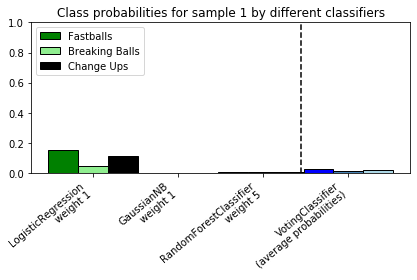

In [126]:
# get class probabilities for the first sample in the dataset
class1_1 = [pr[0, 0] for pr in probas] #Fastballs
class2_1 = [pr[0, 1] for pr in probas] #Breaking Balls
class3_1 = [pr[0, 2] for pr in probas] #Change Ups

# plotting

N = 4  # number of groups
ind = np.arange(N)  # group positions
width = 0.35  # bar width

fig, ax = plt.subplots()

# bars for classifier 1-3
p1 = ax.bar(ind, np.hstack(([class1_1[:-1], [0]])), width,
            color='green', edgecolor='k')
p2 = ax.bar(ind + width, np.hstack(([class2_1[:-1], [0]])), width,
            color='lightgreen', edgecolor='k')
p3 = ax.bar(ind + 2*width, np.hstack(([class3_1[:-1], [0]])), width,
            color='black', edgecolor='k')


# bars for VotingClassifier
p4 = ax.bar(ind, [0, 0, 0, class1_1[-1]], width,
            color='blue', edgecolor='k')
p5 = ax.bar(ind + width, [0, 0, 0, class2_1[-1]], width,
            color='steelblue', edgecolor='k')
p6 = ax.bar(ind + 2*width, [0, 0, 0, class3_1[-1]], width,
            color='lightblue', edgecolor='k')


# plot annotations
plt.axvline(2.8, color='k', linestyle='dashed')
ax.set_xticks(ind + width)
ax.set_xticklabels(['LogisticRegression\nweight 1',
                    'GaussianNB\nweight 1',
                    'RandomForestClassifier\nweight 5',
                    'VotingClassifier\n(average probabilities)'],
                   rotation=40,
                   ha='right')
plt.ylim([0, 1])
plt.title('Class probabilities for sample 1 by different classifiers')
plt.legend([p1[0], p2[0], p3[0]], ['Fastballs', 'Breaking Balls','Change Ups'], loc='upper left')
plt.tight_layout()
plt.show()